<a href="https://colab.research.google.com/github/jbuxt/GEOM180_teaching/blob/main/GEOM180_Workshop_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **GEOM180 Workshop 3: Working with Sentinel data and time series**

In last week's workshop we started to get to grips with using Google Earth Engine with Google Colab and Python. Hopefully you had time to work through all the examples and to read through the code.

In this session we will be:

*  Working with Sentinel-2 data
*   Importing Sentinel-2
*   Be comfortable working with whole ImageCollections
*   Adding NDVI bands to whole ImageCollections
*   Comparing Landsat 8 and Sentinel-2 data and being comfortable with the differences
*   Creating time series of NDVI values from an ImageCollection
*   Compare NDVI vegetation trends with other forms of data
*   Understand the differences in time series which are taken in different land cover types
*   Begin to appreciate how different Python packages can be used to analyse data which we have extracted from GEE
*   Start to use and understand the benefits of non-visual remotely sensed data through Sentinel-1


Any questions, just ask Josh, Joseph or Steve, or email Josh on j.buxton@exeter.ac.uk.

Workshop date: 20th November 2023



# **Task 1: Import initial package and validate Google Earth Engine connection.**

As with the last workshop, these steps are required to connect to Google Earth Engine. You will need to do this everytime you load up Earth Engine!

In [ ]:
import ee

# Trigger the authentication flow.
ee.Authenticate()

# Initialize the library.
ee.Initialize()

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=izAoAYCy04D6BqcSd7MIpUGTvzSpP0suRv7fGeJXsB8&tc=FkaP_yev8Q3vE84IfBztK6ZLqxPaMlUWLhvKzzsEpY8&cc=Bd_TcurafEEcEQRkeyR-koBsJxNMR8zc5NOlcnoTUis

The authorization workflow will generate a code, which you should paste in the box below.
Enter verification code: 4/1AfJohXkLp22Hug04Awql9UwQJrSq5sho2TOpcZeHCcS41ENO_cNll_J24D8

Successfully saved authorization token.


In [ ]:
import geemap

import os
from geemap.conversion import *

# **Task 2: Connect Google Drive to Colab**

In order to easily access your files which are stored in Google Drive, you should mount Google Drive in colab environment.

In the navigation bar on the left of the screen, click the "Files" button. This will open up a panel which allows you to view all of your files. At the top are four buttons, one of which has the Google Drive logo on it. Click this to mount Google Drive, this will then add a drive folder to the files list.

Alternatively you can do this with the code provided below.

In [ ]:
#Use this code to connect between Google Drive and this colab document.

from google.colab import drive
drive.mount('/content/drive')

MessageError: ignored

# **Task 3: Import Sentinel-2 image**

Here we will import and inspect Sentinel-2 data. This dataset is similar to Landsat data, although it has a higher resolution, but a shorter temporal duration.



In [ ]:
#We are going to add some vector data - a shapefile of Devon
#This uses the same borders dataset as last week

FAO_borders = ee.FeatureCollection('FAO/GAUL_SIMPLIFIED_500m/2015/level2')

Devon = FAO_borders.filter(ee.Filter.eq('ADM2_NAME','Devonshire'))

Map = geemap.Map()
Map.centerObject(Devon)
Map.add('layer_manager')
Map.addLayer(Devon,{},'Devon')
Map


Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

In [ ]:
#Now we will import Surface reflectence Sentinel-2 data
#We filter this to get only images that overlap with Devon
#Sentinel-2 images also has a cloud pixel percentage property which we can use to filter out images


S2_dataset = ee.ImageCollection('COPERNICUS/S2_SR').filterDate('2019-01-01', '2019-12-31')\
.filterBounds(Devon)\

visualization = {
    'min': 0.0,
    'max': 3000,
    'bands': ['B4', 'B3', 'B2'],
}

S2_median_RGB_composite = S2_dataset.select(['B4','B3','B2']).median()

#Map = geemap.Map()
Map.centerObject(Devon)
Map.add('layer_manager')                          #This lets us switch between layers on the map
Map.addLayer(S2_median_RGB_composite, visualization, 'S2 RGB Median')
Map
#display(S2_dataset.first())

Map(bottom=22319.0, center=[50.72600769533028, -3.7796069093746922], controls=(WidgetControl(options=['positio…



*Uncomment the `display` command at the end of the code. Use this to inspect the bands and properties of the Sentinel-2 image.*

# **Task 4: Remove clouds from Sentinel-2 ImageCollection**

There are multiple ways that we can remove clouds from our Sentinel-2 ImageCollection. We can select to only include images that have a certain amount of cloud cover in them, and then we can try to mask out the cloud from these images.

**Filtering for the least cloudy images**
Sentinel-2 images also have a property called `"CLOUDY_PIXEL_PERCENTAGE"`, we can use this to filter out particularly cloudy images from our imagecollection.

In the code below, we have selected only images with less than 30% cloud cover. You may wish to vary this.

This is probably a more effective first step at removing clouds than masking them out. However, for certain times of the year it may mean we lose a lot of the available images.

**Masking clouds from the images**
We will now remove the clouds from these the Sentinel-2 images in this  collection.

Like with Landsat 8 last week, Sentinel-2 has a built in quality cloud mask band, in this case the band is 'QA60'. We will use this cloud mask to remove clouds from the image. As we are applying this cloud mask to a whole ImageCollection, rather than just an image, we will need to write a function to apply it to every image.


In [ ]:
#Remove clouds from these Sentinel-2 images

dataset = ee.ImageCollection('COPERNICUS/S2_SR').filterDate('2019-01-01', '2019-12-31')\
.filterBounds(Devon)\
.filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 30))                                         #This filters out images with greater than 30% cloud cover5

#We now define a function to remove these clouds

def S2_cloud_removal(image):
  QA = image.select('QA60')             #QA60 is the cloud quality band

  #There are two values associated with clouds; Bit 10 for opaque clouds and Bit 11 for Cirrus clouds
  #We need to define the values that we want for these masks
  cloud_bit_mask = 1 << 10
  cirrus_bit_mask = 1 << 11

  mask = (
      QA.bitwiseAnd(cloud_bit_mask).eq(0)
      .And(QA.bitwiseAnd(cirrus_bit_mask)).eq(0)
  )

  return image.updateMask(mask)
  #.divide(10000)                     #.divide(10000) is necessary as the Sentinel-2 bands need to be rescaled

#Remove clouds from the image

cloud_free_dataset = dataset.map(S2_cloud_removal)
cloud_free_dataset_composite = cloud_free_dataset.select(['B4','B3','B2']).median()


#RGB_visualisation = {'min':0,'max':0.3,'bands':['B4','B3','B2']}


Map.centerObject(Devon)
Map.add('layer_manager')                          #This lets us switch between layers on the map
Map.addLayer(cloud_free_dataset_composite, visualization, 'S2 RGB Cloud Free Composite')
Map


Map(bottom=11310.0, center=[50.72600769533028, -3.7796069093746922], controls=(WidgetControl(options=['positio…

*Here we have calculated the median image from the ImageCollection. Change this to the mean and see whether this is different or not.*

# **Task 5: Compare this with Landsat 8 Data for the same time period**

Last week we worked with Landsat 8 images. Below is the code that will allow you to implement the same work through that you have just implemented for Sentinel-2, but for Landsat data.

Work through it and add the Landsat 8 image to the map. Inspect the Landsat 8 data and consider the difference between the two.

In [ ]:
#Landsat 8 code from last week's workshop

#Then we will import our Landsat ImageCollection
#By filtering the bounds, we will get any Landsat 8 image which intersects with the geometry

L8_dataset = ee.ImageCollection('LANDSAT/LC08/C02/T1_L2').filterDate('2019-01-01', '2019-12-31').filterBounds(Devon)


# Apply scaling factors - here we define a function to map over the whole collection, rather than a single image.
def apply_scale_factors(image):
  optical_bands = image.select('SR_B.').multiply(0.0000275).add(-0.2)
  thermal_bands = image.select('ST_B.*').multiply(0.00341802).add(149.0)
  return image.addBands(optical_bands, None, True).addBands(
      thermal_bands, None, True
  )

#Create coud cover remover function to apply to whole ImageCollection
def cloud_masking(image):
  cloudShadowBitMask = (1 << 3)
  cloudsBitMask = (1 << 5)
  QA = image.select(['QA_PIXEL'])
  cloud_mask = QA.bitwiseAnd(cloudShadowBitMask).eq(0).And(QA.bitwiseAnd(cloudsBitMask).eq(0))
  return image.updateMask(cloud_mask)

L8_dataset = L8_dataset.map(apply_scale_factors)
L8_dataset_cloud_masked = L8_dataset.map(cloud_masking)

L8_dataset_median = L8_dataset_cloud_masked.median()


Map.centerObject(L8_dataset)
visParams = {'bands': ['SR_B4', 'SR_B3', 'SR_B2'],'min':0,'max':0.25};
Map.addLayer(L8_dataset_median,visParams,'L8 Median')
#Map.addLayer(Devon,{'color':'FF0000'},'Cornwall')
Map



Map(bottom=44329.0, center=[50.74166968624287, -3.6433410644531254], controls=(WidgetControl(options=['positio…

*Zoom into an urban area such as Exeter to see the major difference between Landsat 8 and Sentinel-2.*

# **Task 6: Calculate NDVI and add band to every image in the ImageCollect in a new study area**

Last week we calculated NDVI for a single Landsat image. Here we will do this for a whole ImageCollection of Sentinel-2 images.

This involves writing a function to add NDVI to each image and then mapping this function over the whole collection.

We're going to apply this to a different study area.


In [ ]:
#Here we define a new study area
#This is an arid site in the Sahel where there is minimal vegetation
#But the vegetation that does exist can form interesting spatial patterns
#Speak to Josh if you want to know more about the feedbacks that lead to this

#We first define the latitude and longitude
lat= 15.8
lon= -14.36

#And create a new Region of Interest
point = ee.Geometry.Point([lon,lat])              #Here we create a point object
new_roi = point.buffer(10)                        #We can create a buffer around this object in metres

Map = geemap.Map()                                #This will create a new interactive map which deletes the old layers
Map.centerObject(new_roi)
Map.add('layer_manager')
Map.addLayer(point,{},'Point')
Map.addLayer(new_roi,{'color': 'ff0000'},'New ROI')
Map

Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

In [ ]:
#We're going to call in Sentinel-2 data for this region


dataset = ee.ImageCollection('COPERNICUS/S2_SR').filterDate('2019-01-01', '2022-12-31')\
.filterBounds(new_roi)\
.filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20))                                         #This filters out images with greater than 20% cloud cover5

#We now define a function to remove these clouds

def S2_cloud_removal(image):
  QA = image.select('QA60')             #QA60 is the cloud quality band

  #There are two values associated with clouds; Bit 10 for opaque clouds and Bit 11 for Cirrus clouds
  #We need to define the values that we want for these masks
  cloud_bit_mask = 1 << 10
  cirrus_bit_mask = 1 << 11


  mask = (
      QA.bitwiseAnd(cloud_bit_mask).eq(0)
      .And(QA.bitwiseAnd(cirrus_bit_mask)).eq(0)
  )

  return image.updateMask(mask)
  #.divide(10000)                     #.divide(10000) is necessary as the Sentinel-2 bands need to be rescaled

#Remove clouds from the image

cloud_free_dataset = dataset.map(S2_cloud_removal)
S2_median_composite = cloud_free_dataset.select(['B4','B3','B2']).median()



Map.add('layer_manager')                          #This lets us switch between layers on the map
Map.addLayer(S2_median_composite, visualization, 'S2 RGB Cloud Free')
Map




Map(bottom=2166.0, center=[15.800000017290957, -14.359999852766636], controls=(WidgetControl(options=['positio…

Now we are ready to calculte NDVI and to add it as an additional band.

We do this in the same way as last week, but as Sentinel-2 has a different band numbering, we have to use different bands.

In [ ]:
#Calculate the NDVI and add it as a band
def addNDVI(image):
  NIR = image.select(['B8'])
  RED = image.select(['B4'])

  NDVI = (NIR.subtract(RED)).divide(NIR.add(RED)).rename("NDVI")
  return image.addBands(NDVI)

#We now map this function over the ImageCollection

ndvi_dataset = cloud_free_dataset.map(addNDVI)

ndviVis = {
    'min': -1,
    'max': 1,
    'palette': ['blue', 'white', 'green']};

Map.addLayer(ndvi_dataset.select(['NDVI']),ndviVis,'NDVI')
Map

#display(ndvi_dataset)

Map(bottom=239362.0, center=[15.650808580175482, -14.22832489013672], controls=(WidgetControl(options=['positi…

# **Task 7: Finding the date of an image**

Last week we discussed what the date variable was for an image.

The date is given in the `system:time_start` property. This looks like a long string of numbers that doesn't look like our usual idea of the date.

This number is the image's Unix timestamp in milliseconds. It is a common way to count computational time and is the number of milliseconds since 1st January 1970. For more information about this, you can read here: [Wikipedia: Unix time](https://en.wikipedia.org/wiki/Unix_time).

If we want to check the date for an image, we can do so with the code below.

In [ ]:
#Check date parameter for the first image in the collection

img = ndvi_dataset.first()

display(img)

img_date = img.date().format('YYYY-MM-dd')

display(img.select("system:time_start"))
display(img_date)

# **Task 8: Inspect changes in images**

We now have a Sentinel-2 dataset with an NDVI band. We may be interested in how vegetation changes over time, whether across a year or over a longer time frame.

One way to do this is to map these images in different time periods, which will do below. After this we will see how to plot a time series.


In [ ]:
#One way to inspect landscape change is to choose two different time periods
#Below we choose data from September and May and make a monthly median composite

Sep_NDVI_composite = ndvi_dataset.filterDate('2019-09-01', '2019-09-30').median()
May_NDVI_composite = ndvi_dataset.filterDate('2019-05-01', '2019-05-30').median()



display(Sep_NDVI_composite)

Map.addLayer(Sep_NDVI_composite.select(['NDVI']),ndviVis,'Sep NDVI')
Map.addLayer(May_NDVI_composite.select(['NDVI']),ndviVis,'May NDVI')
Map


*What differences do you notice between the vegetation at different times of the year? What might be driving this change?*

*Try filtering the ImageCollection by different time periods to see how this changes*

# **Task 9: Calculate time series from ImageCollection**

While it can be effective to plot changes in vegetation for each month, we can see that this might be time consuming or not necessarily the best way to monitor change.

One way to track changes in vegetation is to plot a time series of a specific variable - in this case, NDVI.

We can do this for a specifc point, or over a certain area. To calculate spatial or temporal statistics, Earth Engine uses 'reducers'. For example, these can be used to calculate the spatial mean of an image, or to take the temporal mean across an ImageCollection.

The `.reduceRegion()` function requires a reducer as an input. Below we use `ee.Reducer.mean()`, but other reducers such as median or standard deviation exist.

Below we will be working to calculate the NDVI time series from an ImageCollection.




In [ ]:
#First, we will take the spatial mean from a single Image
#To do this, we will reduce the region by the geometry

test_img = ndvi_dataset.first()
test_img_ndvi = test_img.select('NDVI')            #As we are only interested in NDVI, we select this band

display(test_img_ndvi)

mean_img = test_img_ndvi.reduceRegion(reducer=ee.Reducer.mean(),geometry=new_roi,scale=10)

display(mean_img)
display(test_img.date())

In [ ]:
#Now that we've got this to work for a single image, we will write a function to apply this across the ImageCollection

def NDVI_point_mean(img):
  #img_NDVI = img.select('NDVI')
  mean_NDVI = img.reduceRegion(reducer=ee.Reducer.mean(),geometry=new_roi,scale=10).get('NDVI')
  return img.set('NDVI_roi_mean',mean_NDVI)


S2_NDVI_point_reduced = ndvi_dataset.map(NDVI_point_mean)


display(S2_NDVI_point_reduced)

Name,Description
B1,Aerosols
B2,Blue
B3,Green
B4,Red
B5,Red Edge 1
B6,Red Edge 2
B7,Red Edge 3
B8,NIR
B8A,Red Edge 4
B9,Water vapor


*Inspect the ImageCollection that this produces. Every image corresponds to a date. Check one of the images to see that we have added a band called `'NDVI_roi_mean'`*

# **Task 10: Plotting time series**


We now have an ImageCollection, where each image has a property which is the mean NDVI in our region of interest.

To start to make plots from this, we need to extract this data from the ImageCollection and store it in a data frame to work with it in Python. We first turn this ImageCollection into a list of lists, and from there we can convert it to a data frame.

This will require the creation of a Python data frame, and therefore we will be using more Python packages.

In [ ]:
#Import new Python packages

import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime

In [ ]:
#We must now convert the NDVI Image Collection into a list
#This list has two columns

nested_list = S2_NDVI_point_reduced.reduceColumns(ee.Reducer.toList(2), ['system:time_start','NDVI_roi_mean']).values().get(0)


display(nested_list)

*Inspect the list that we created above. What two variables does each row have?*

To better work with this list in Python, we will convert it to a Pandas DataFrame.

In [ ]:
#Define the DataFrame

df = pd.DataFrame(nested_list.getInfo(), columns=['system:time_start','NDVI_roi_mean'])

#If we want to have the "time_start" in a more readable form
#We can convert this with the to_datetime command and add this date as an extra olumn

df['datetime'] = pd.to_datetime(df['system:time_start'],unit='ms')
df['date'] = pd.to_datetime(df['system:time_start'],unit='ms').dt.date

#Note the extra ".dt.date" command removes the time component of the date
#I have included them both here so you can see the difference, usually we'd just use one or the other

display(df)

,system:time_start,NDVI_roi_mean,datetime,date
0,1547552222000,0.162559,2019-01-15 11:37:02.000,2019-01-15
1,1547984226000,0.135426,2019-01-20 11:37:06.000,2019-01-20
2,1548848226000,0.129957,2019-01-30 11:37:06.000,2019-01-30
3,1550144223000,0.127862,2019-02-14 11:37:03.000,2019-02-14
4,1551008222000,0.144239,2019-02-24 11:37:02.000,2019-02-24
...,...,...,...,...
159,1669808225167,0.126688,2022-11-30 11:37:05.167,2022-11-30
160,1670672223430,0.111095,2022-12-10 11:37:03.430,2022-12-10
161,1671104226391,0.139179,2022-12-15 11:37:06.391,2022-12-15
162,1671536225706,0.132706,2022-12-20 11:37:05.706,2022-12-20


Now that we have the time series as a dataframe, we can now plot it.

Below I have provided code to do so with the Seaborn Python package or the Matplotlib package.

Please let me know which you are using more of in your other modules, and I can try to stick with one.

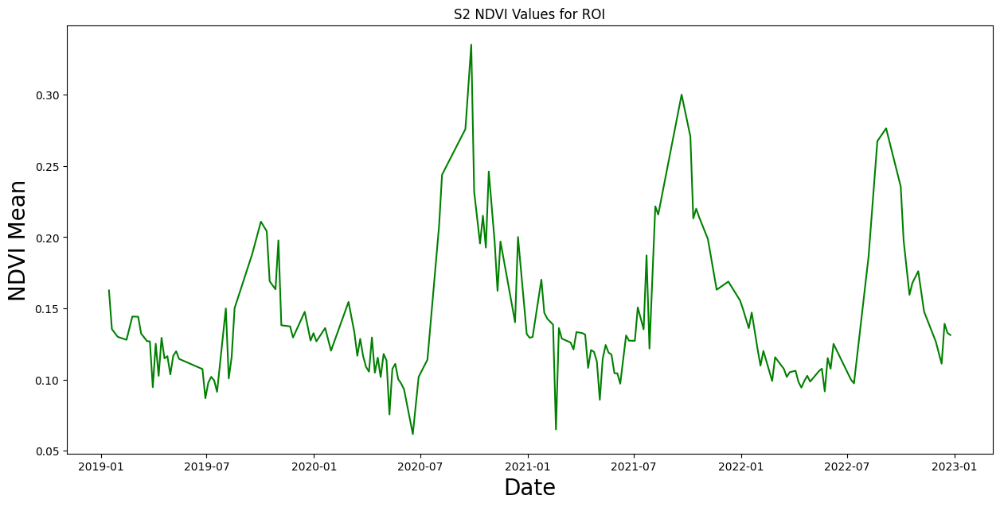

In [ ]:
# We can define an initial figure with dimensions of 15 x 7
fig, ax = plt.subplots(figsize=(15,7))

# We can then use seaborn lineplot to make the figure
# Here our data argument is our initial dataframe, and we select two of the columns as the x and y values
sns.lineplot(data=df, x="date", y="NDVI_roi_mean", ax=ax,color='green')

# We can then set the labels and title
ax.set_ylabel('NDVI Mean',fontsize=20)
ax.set_xlabel('Date',fontsize=20)
ax.set_title('S2 NDVI Values for ROI');

Text(0.5, 1.0, 'S2 NDVI Values for ROI')

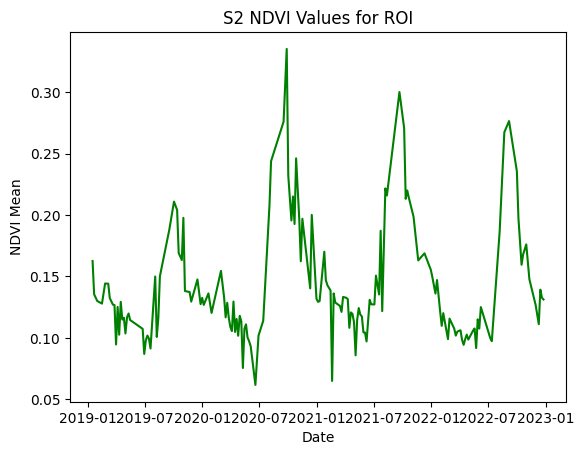

In [ ]:
#If you prefer to work in Matplotlib then here is the code below to make the same plot

plt.plot(df['date'],df['NDVI_roi_mean'],color='green')
plt.xlabel('Date')
plt.ylabel('NDVI Mean')
plt.title('S2 NDVI Values for ROI')


*What do you notice about how the NDVI value changes across different time scales? How does it change within a month? Within a year? Across several years?*

*What could be driving this change?*

*How might you investigate this change?*

*What other data processing could you implement to smooth these changes?*

# **Task 11: Incorporating other datasets: Precipitation data**

One potential driver of vegetation seasonal cycles is precipitation.

There are numerous precipitation reanalysis datasets on GEE. We will use the [CHIRPS daily dataset](https://developers.google.com/earth-engine/datasets/catalog/UCSB-CHG_CHIRPS_DAILY) for this.

**Note:** Climate reanalysis data can be thought of as 'reconstructed' weather data. It is generated from from recorded and modelled values, and there are areas of the world where data availability is limited and this can affect the model output. Its important to know that this data is not of the same sort as Sentinel-2 or Landsat 8 data.

In [ ]:
chirps_dataset = ee.ImageCollection('UCSB-CHG/CHIRPS/DAILY').filter(
    ee.Filter.date('2019-01-01', '2022-12-31')
)

precipitation = chirps_dataset.select('precipitation')


In [ ]:
#Calculate precip point mean

def precip_point_mean(img):
  #img_NDVI = img.select('NDVI')
  mean_precip = img.reduceRegion(reducer=ee.Reducer.mean(),geometry=new_roi,scale=10).get('precipitation')
  return img.set('precip_roi_mean',mean_precip)


precip_point_reduced = precipitation.map(precip_point_mean)


#display(precip_point_reduced)

precip_nested_list = precip_point_reduced.reduceColumns(ee.Reducer.toList(2), ['system:time_start'.format("yyyy-MM-dd"),'precip_roi_mean']).values().get(0)

display(precip_nested_list)



*Notice how this list of precipitation data has many more entries to the NDVI data, why is this?*

*What is the resolution of the CHIRPS data?*

*Why might it be difficult to do a pixel by pixel analysis between vegetation and climate data?*

*Look in the GEE Data Catalog - what other climate datasets would also be appropriate to use instead of CHIRPS?*

In [ ]:
#As with NDVI, we must convert this into a dataframe

df_precip = pd.DataFrame(precip_nested_list.getInfo(), columns=['system:time_start','precip_roi_mean'])

#If we want to have the "time_start" in a more readable form
#We can convert this with the to_datetime command and add this date as an extra olumn

#df_precip['datetime'] = pd.to_datetime(df_precip['system:time_start'])
df_precip['date'] = pd.to_datetime(df_precip['system:time_start'],unit='ms').dt.date

#Note the extra ".dt.date" command removes the time component of the date
#I have included them both here so you can see the difference, usually we'd just use one or the other

display(df_precip)

,system:time_start,precip_roi_mean,date
0,1546300800000,0.0,2019-01-01
1,1546387200000,0.0,2019-01-02
2,1546473600000,0.0,2019-01-03
3,1546560000000,0.0,2019-01-04
4,1546646400000,0.0,2019-01-05
...,...,...,...
1455,1672012800000,0.0,2022-12-26
1456,1672099200000,0.0,2022-12-27
1457,1672185600000,0.0,2022-12-28
1458,1672272000000,0.0,2022-12-29


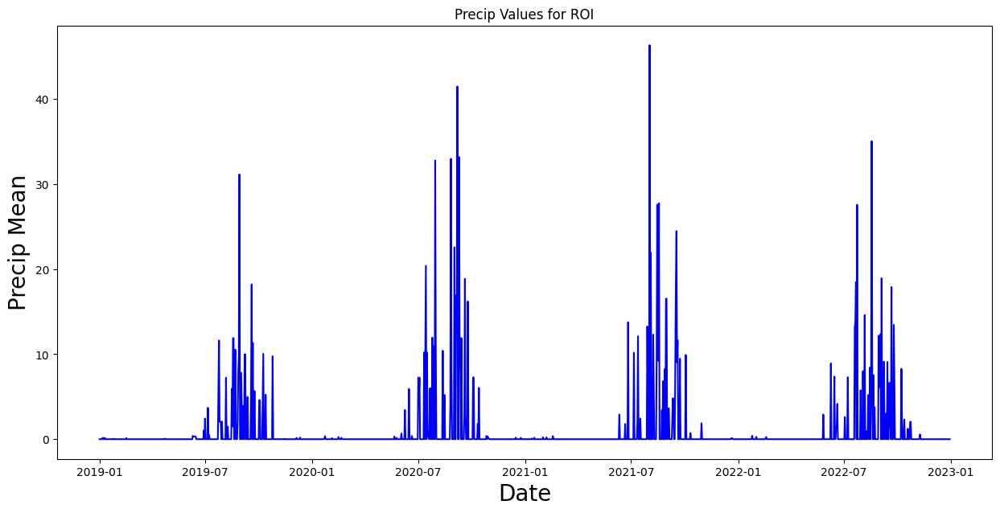

In [ ]:
#Now we can plot this precipitation data

# we create a figure with pyplot and set the dimensions to 15 x 7
fig, ax = plt.subplots(figsize=(15,7))

# we'll create the plot by setting our dataframe to the data argument
sns.lineplot(data=df_precip, x="date", y="precip_roi_mean", ax=ax,color='blue')

# we'll set the labels and title
ax.set_ylabel('Precip Mean (mm/day)',fontsize=20)
ax.set_xlabel('Date',fontsize=20)
ax.set_title('Precip Values for ROI');

*What do you notice about the precipitation data for our region of interest? How might this vary for other parts of the world?*

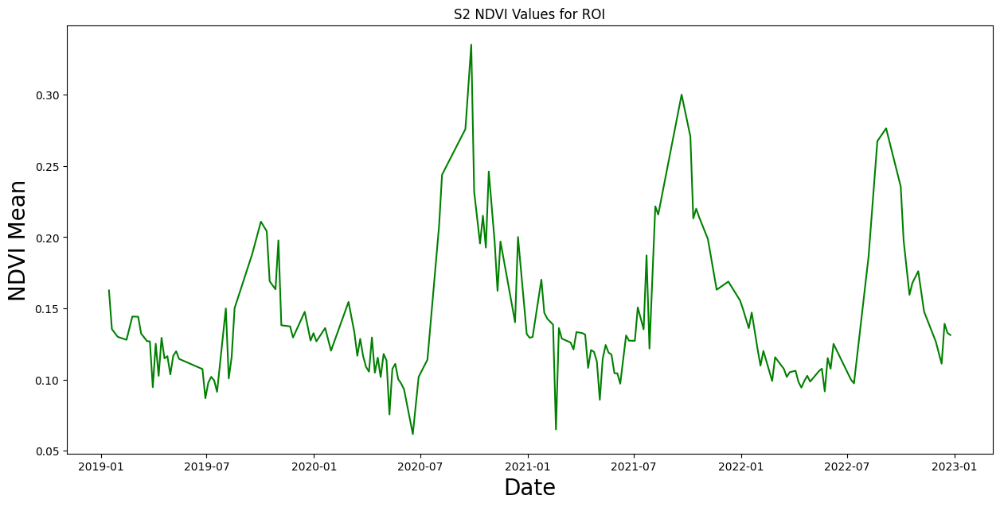

In [ ]:
#Replot NDVI Data

# we create a figure with pyplot and set the dimensions to 15 x 7
fig, ax = plt.subplots(figsize=(15,7))

# we'll create the plot by setting our dataframe to the data argument
sns.lineplot(data=df, x="date", y="NDVI_roi_mean", ax=ax,color='green')

# we'll set the labels and title
ax.set_ylabel('NDVI Mean',fontsize=20)
ax.set_xlabel('Date',fontsize=20)
ax.set_title('S2 NDVI Values for ROI');

*What do you notice when you consider the precipitation and NDVI data?*

**Plotting both time series together**

The two above plots allow us to compare precipitation with NDVI levels, however if we plot them on the same graph, it may be easier to see this relationship.

One simple way of doing this is to give both datasets the same temporal resolution - in this case, a monthly resolution. This is the way we will do this for simplicity, but it is definitely not the only way to do so!

Below we average the NDVI for each month and sum the rainfall per month.

In [ ]:
#This code below allows us to group the data for each month
#We create a series of each of them

NDVI_monthly = df.groupby(pd.PeriodIndex(df['date'], freq="M"))['NDVI_roi_mean'].mean()

precip_monthly = df_precip.groupby(pd.PeriodIndex(df_precip['date'], freq="M"))['precip_roi_mean'].sum()

#NDVI_monthly is a series, we will display it so you can inspect it further
#It has two columns, one is its index column (the date) and the other is the NDVI roi mean values
display(NDVI_monthly)

#As it is easier to work with a DataFrame rather than a series, we construct one which has a date column and an NDVI mean column
data_monthly_df = pd.DataFrame({'date':NDVI_monthly.index.to_timestamp(), 'NDVI_mean':NDVI_monthly.values})

#We then add the precipitation data as an additional column
data_monthly_df['monthly_precip'] = precip_monthly.values

display(data_monthly_df)

NameError: ignored

Now that we have our data at a monthly resolution and in the same data frame, we can plot them both together.


Text(0, 0.5, 'Precip (mm/month)')

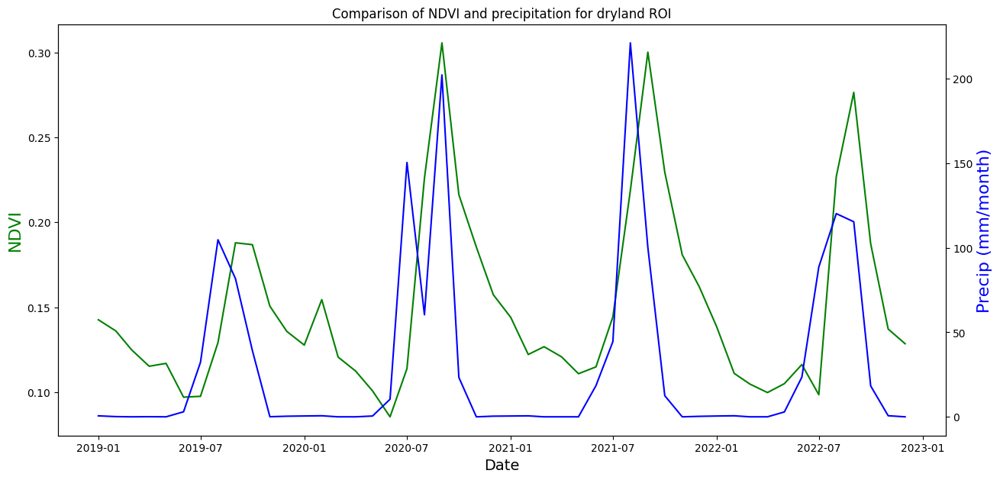

In [ ]:
#To plot both datasets on the same figure, we define our initial plot and then add a second y-axis to it

# We can define an initial figure with dimensions of 15 x 7
fig, ax = plt.subplots(figsize=(15,7))

sns.lineplot(data=data_monthly_df, x= 'date', y='NDVI_mean', color="g")

#add x-axis label
ax.set_xlabel('Date', fontsize=14)

#add y-axis label
ax.set_ylabel('NDVI', color='green', fontsize=16)

#add title
ax.set_title('Comparison of NDVI and precipitation for dryland ROI');

ax2 = plt.twinx()
sns.lineplot(data=data_monthly_df, x='date', y='monthly_precip', color="b", ax=ax2)

ax2.set_ylabel('Precip (mm/month)', color='blue', fontsize=16)

*What does the above plot tell us about the change of vegetation over time? How are climatic factors coupled with the vegetation?*

*Would you expect this relationship between vegetation and climate to be true for all other locations and land cover types?*

*What other variables might drive changes in vegetation?*

*If this was an area which had undergone landcover change, such as deforestation, how might we expect the NDVI to change? What processing steps could we use to detect this? What resolution data might we use? Try out some of these ideas in the additional exercises section below.*

**Note:** It is not always right to aggregate this data to a monthly resolution, and we can lose data by doing this. There are also times that it is not right to make a 2 y-axis plot of the type we have made here, as it risks misrepresenting relationships.

# **Additional exercise: Time series of other land types**

Repeat the above steps for calculating a time series but choose a different region of interest and vary the time period that you are observing.

For this, you may want to choose woodland or grassland, or perhaps a region that has suffered from a wildfire or drought.

Make this time series for as long or little time period as you wish. Longer time series may help you to see seasonal trends or deviatons.

I have provided some examples geometries below, but I would encourage you to also think about other areas or land cover types.

*Look at how the NDVI values change over time, the differences in the absolute values and the amount of data you may have for different regions.*

In [ ]:
#Woodland ROI

wood_point = ee.Geometry.Point([-3.529,50.752])
wood_roi = wood_point.buffer(50)

#Agricultural ROI

agri_point = ee.Geometry.Point([-3.574,50.735])
agri_roi = agri_point.buffer(50)


#Wildfire ROI

fire_point = ee.Geometry.Point([-121.545,39.773])
fire_roi = fire_point.buffer(50)


# **Extended exercise: Using other forms of data - Sentinel-1**

So far we have used data from Landsat 8 and Sentinel-2, both of which use passive imaging sensors. These work well for detecting changes in vegetation in certain regions.

Other forms of data may be useful when investigating landscape changes in areas with lots of cloud cover or minimal daylight. One such dataset is the active sensor employed by Sentinel-1.

Below we will take a quick look at using Synthetic Aperture Rader (SAR) data from Sentinel-1 ([GEE Data Catalog page](https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S1_GRD#bands)).

We will select the data with a vertical-vertical polarisation and which has been acquired in the [Interferometric Wide Swath](https://sentinel.esa.int/web/sentinel/user-guides/sentinel-1-sar/acquisition-modes/interferometric-wide-swath) mode.

Sentinel-1 consists of two satellites which employ a radar imaging system at a 20m resolution. In the metadata, Sentinel-1 images are classified as ascending, if the satellite was travelling from the South to North Pole, or descending, if travelling the other way. Not every region is always mapped by Sentinel-1, so return times and data availability may differ depending on the region.

In [ ]:
#For this exercise, we'll define a new region of interest.
#In this case, the Vatnajökull Glacier in Iceland

ice_roi = ee.Geometry.Point(-17.317,64.247)


In [ ]:

#This is an adapted version of the standard GEE code for importing and working with S1 data

def mask_edge(image):
  edge = image.lt(-30.0)
  masked_image = image.mask().And(edge.Not())
  return image.updateMask(masked_image)


#This code calls in the S1 ImageCollection
S1_vv = (
    ee.ImageCollection('COPERNICUS/S1_GRD')
    .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))          #S1 images are polarised - vertical or horizontal. VV here are vertical for transmission and reception
    .filter(ee.Filter.eq('instrumentMode', 'IW'))                                     #Select Interferometric Wide Swath - this is the standard acquisation mode over land
    .filterBounds(ice_roi)
    .select('VV')
    .map(mask_edge)
)

#S1 images are classified as "Descending" or "Ascending depending on the satellite's path
desc = S1_vv.filter(ee.Filter.eq('orbitProperties_pass', 'DESCENDING'))
asc = S1_vv.filter(ee.Filter.eq('orbitProperties_pass', 'ASCENDING'))

#Here we will just use the descending collection for simplicity

desc_winter2016 = desc.filter(ee.Filter.date('2016-01-01', '2016-02-28'))
desc_winter2023 = desc.filter(ee.Filter.date('2023-01-01', '2023-02-28'))

desc_summer2016 = desc.filter(ee.Filter.date('2016-06-01', '2016-08-31'))
desc_summer2023 = desc.filter(ee.Filter.date('2023-06-01', '2023-08-31'))


Map = geemap.Map()
Map.add('Layer_manager')
Map.centerObject(ice_roi)
Map.set_center(-17.317,64.247,8)
Map.add_layer(desc_summer2016.mean(),{'min': -50, 'max': 5},'Summer 2016',True)
Map.add_layer(desc_summer2023.mean(),{'min': -50, 'max': 5},'Summer 2023',True)
Map.add_layer(desc_winter2016.mean(),{'min': -50, 'max': 5},'Winter 2016',True)
Map.add_layer(desc_winter2023.mean(),{'min': -50, 'max': 5},'Winter 2023',True)
Map.add_layer(ice_roi,{'color':'ff0000'},'Ice ROI')
Map


*Why might Sentinel-1 be better for detecting changes in land cover in higher latitudes?*

*Think of ways that the ascending and descending datasets can be combined to gain extra information about the lanscape.*